## Camera Calibration 

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob

from scipy.signal import argrelmax
from scipy.signal import find_peaks_cwt

%matplotlib inline

In [2]:
def calibrate_camera():
    # Arrays to store object points and image points from all the images
    objpoints = [] # 3D points in real world space
    imgpoints = [] # 2D points in image plane
    
    # Number of inner corners per row and column
    nx = 9
    ny = 6
    
    # Prepare object points by creating  6x8 points in an array each with 3 columns for the x,y,z coordinates of each corner
    objp = np.zeros((ny*nx, 3), np.float32)
    
    # Use numpy mgrid function to generate the coordinates that we want
    objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)
    
    # List of paths of camera calibration images
    image_names = glob.glob("camera_cal/*")
    
    # Loop through all the calibration images
    for name in image_names:
        # Read in the image
        img = mpimg.imread(name)

        # Convert the image to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

        if(ret):
            image = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
            #If corners are found, add image points and object points
            imgpoints.append(corners)
            # Object points will be the same for all of the calibration images
            # Since they represent a real chessboard
            objpoints.append(objp)
    return cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2], None, None)

In [3]:
# Calibrate the camera
ret, mtx, dist, rvecs, tvecs = calibrate_camera()

## Un-Distort

In [4]:
def undistort(image):
    """
        Simple wrapper that un distorts an image
        Using previously computed camera matrix and
        distortion coefficients
    """
    return cv2.undistort(image, mtx, dist)

In [5]:
def plot_on_subplots(images, titles, cmap=None):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    
    if cmap:
        ax1.imshow(images[0], cmap=cmap)
    else:
        ax1.imshow(images[0])
    ax1.set_title(titles[0])

    if(cmap):
        ax2.imshow(images[1], cmap=cmap)
    else:
        ax2.imshow(images[1])
        
    ax2.set_title(titles[1])
    

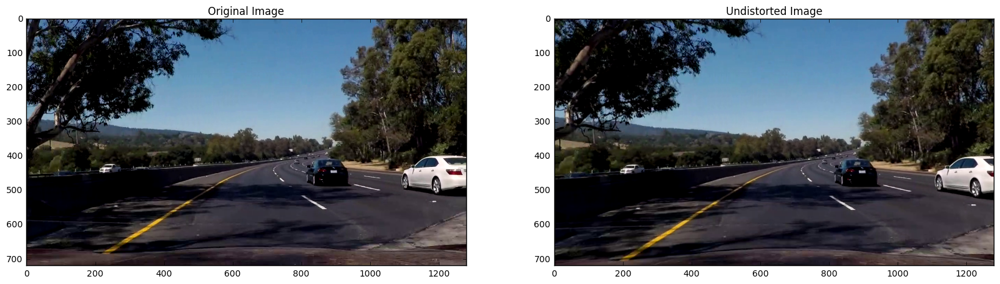

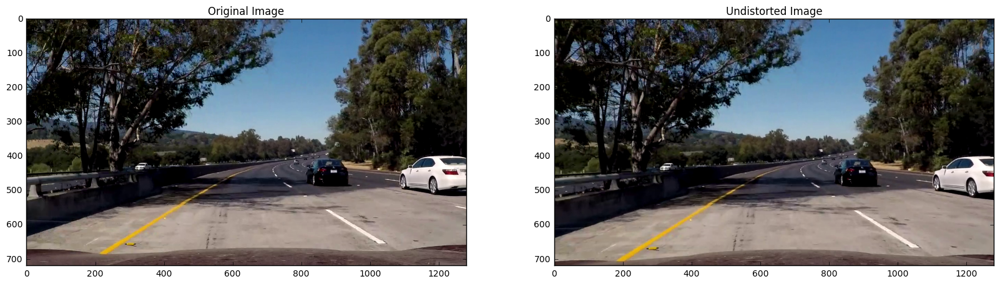

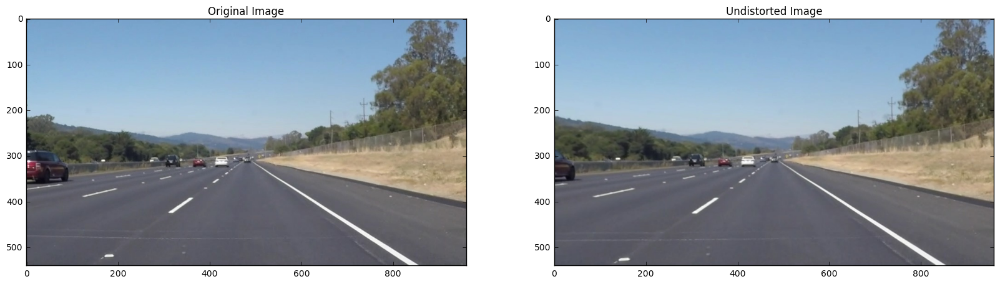

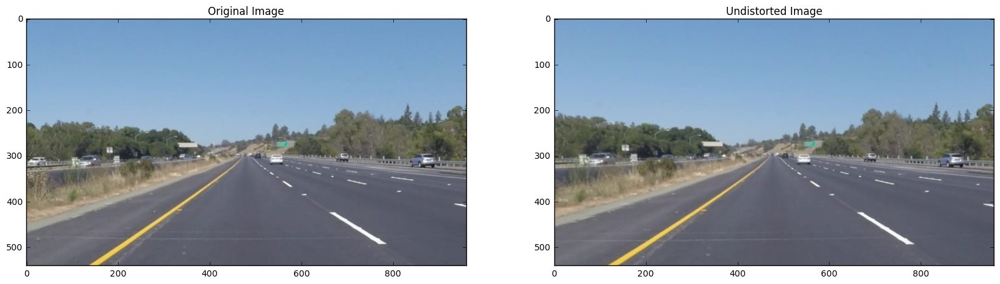

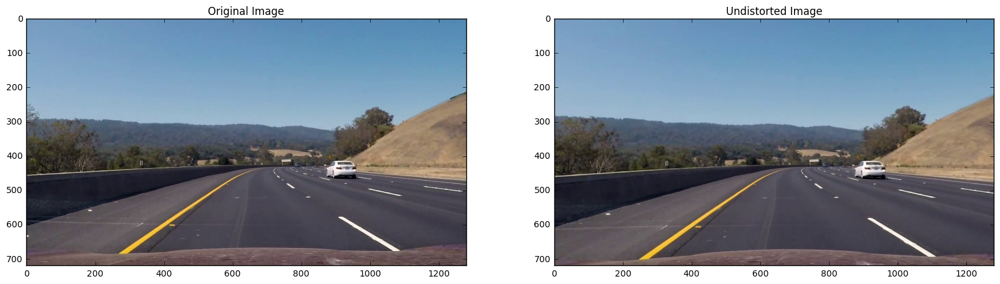

...

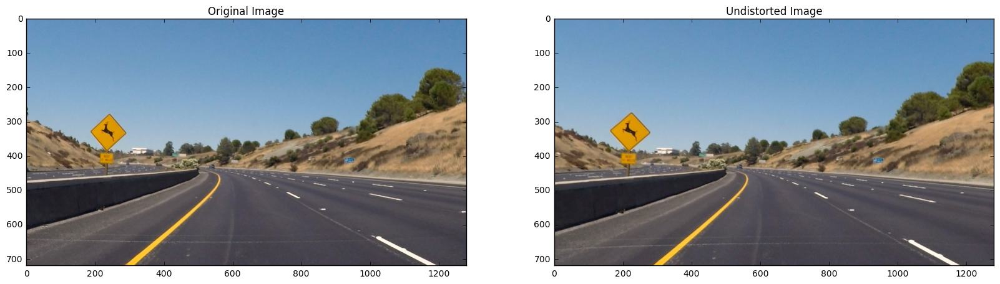

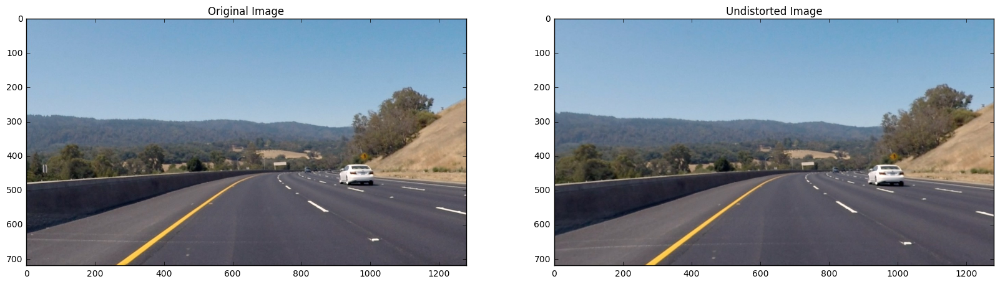

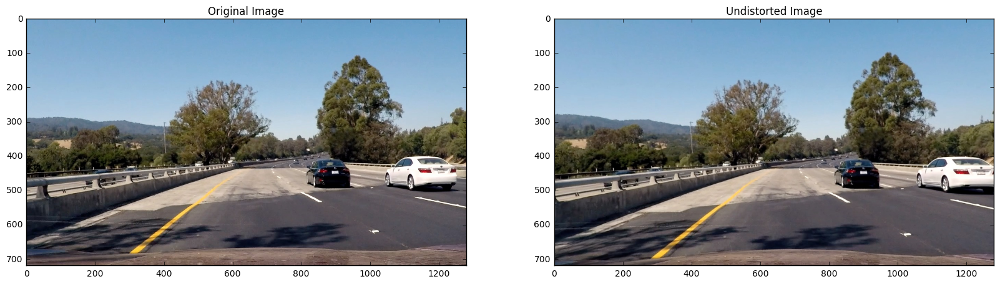

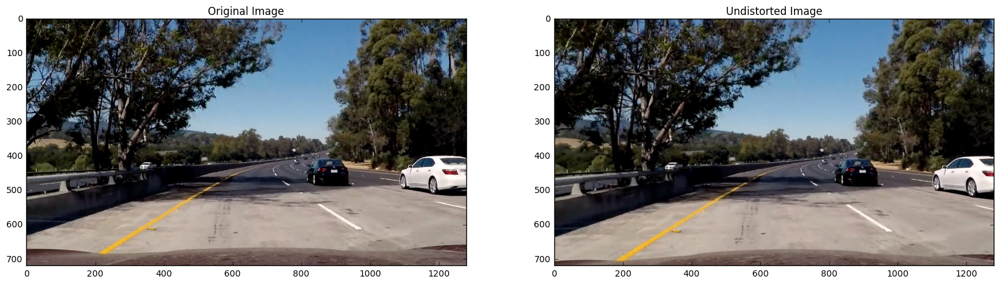

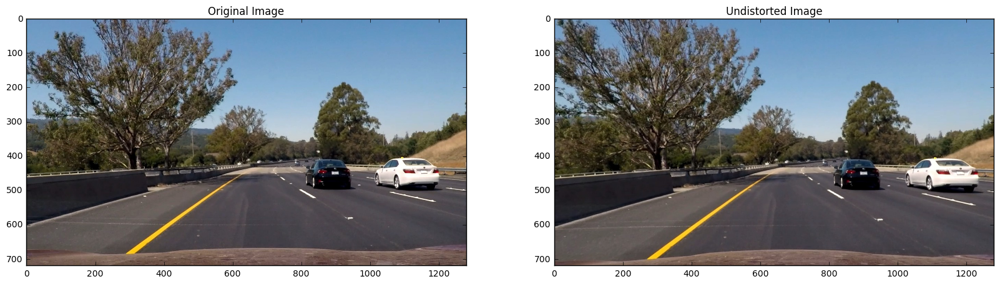

In [6]:
# Perform un-distortion on the test images
for image_name in glob.glob("test_images/*"):
    img = mpimg.imread(image_name)
    un_dist_img = undistort(img)
    
    plot_on_subplots([img, un_dist_img], ["Original Image", "Undistorted Image"])
    plt.show()

In [7]:
def gaussian_blur(img, kernel_size=5):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

## Binary Image generator

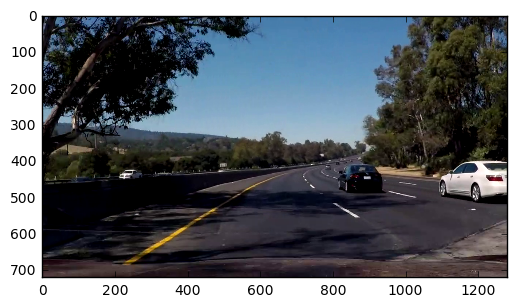

In [8]:
image = mpimg.imread(glob.glob("test_images/*")[0])
plt.imshow(image)

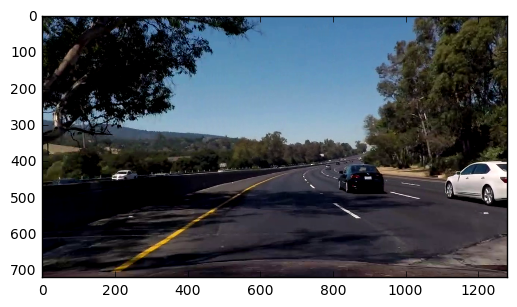

In [9]:
image = undistort(image)
plt.imshow(image)

In [10]:
def perform_color_selection(img):
    img[img[:] < 70] = 0
    return img

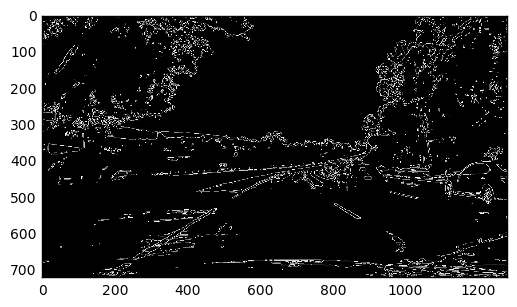

In [11]:
canny = cv2.Canny(perform_color_selection(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)), 0, 150)
plt.imshow(canny, cmap="gray")

In [12]:
def get_grayscale_thresholded_img(img, thresh=(130, 255)):
    """
        Convert to grayscale and threshold the resulting output
    """
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    binary = np.zeros_like(gray)
    
    binary[(gray > thresh[0]) & (gray < thresh[1])] = 1
    
    return binary

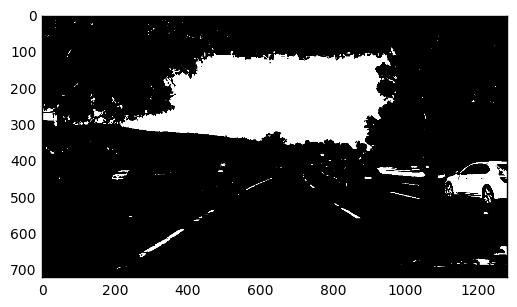

In [13]:
gti = get_grayscale_thresholded_img(image)
plt.imshow(gti, cmap="gray")

In [14]:
def get_sobel_binary(image, thresh_min=20, thresh_max=200):
    """
        Return a binary images after application
        of a sobel filter and thresholds to the result
    """
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Take the derivative in x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) 
    
    # Absolute x derivative to accentuate lines away from horizontal
    abs_sobelx = np.absolute(sobelx) 
    
    # Scale to 8 bit grayscale image
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Apply a threshold
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    return sxbinary

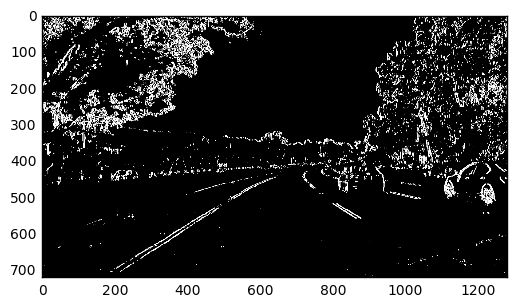

In [15]:
sobel_binary = get_sobel_binary(image)
plt.imshow(sobel_binary, cmap="gray")

In [16]:
def get_channel_index_hls(chanel_name):
    """
        Returns the index of each channel
        for an image in HLS color channel
    """
    if(chanel_name == "h"):
        return 0
    elif(chanel_name == "l"):
        return 1
    elif(chanel_name == "s"):
        return 2

In [17]:
def get_hls_channel_binary(image, channel_name='s', thresh_min=180, thresh_max=255):
    # Convert to HLS color space
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    
    # Extract the desired channel
    channel_index = get_channel_index_hls(channel_name)
    channel = hls[:,:,channel_index]
    
    # Apply the threshold
    channel_binary = np.zeros_like(channel)
    channel_binary[(channel >= thresh_min) & (channel <= thresh_max)] = 1
    
    return channel_binary    

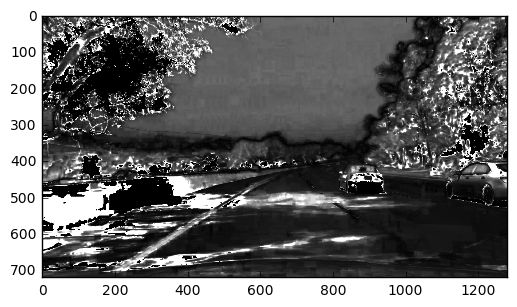

In [18]:
plt.imshow(cv2.cvtColor(image, cv2.COLOR_RGB2HLS)[:,:,2], cmap="gray")

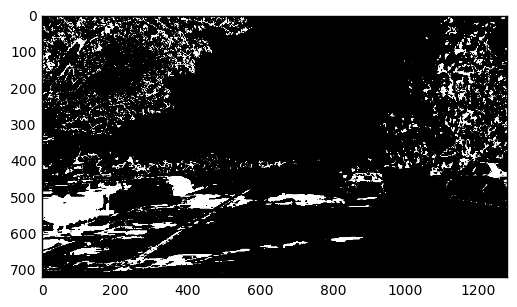

In [19]:
#s_binary = get_hls_channel_binary(image, channel_name="l", thresh_min=195)
s_binary = get_hls_channel_binary(image)
plt.imshow(s_binary, cmap="gray")

In [20]:
def get_color_selection(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    
#     white = np.uint8([[[0, 0, 255]]])
#     plt.imshow(white)
#     hsv_white = cv2.cvtColor(white, cv2.COLOR_RGB2HSV)
    
#     lower_white = np.array([min(0, hsv_white[0][0][0] - 20), 100, 100], dtype=np.uint8)
#     upper_white = np.uint8([hsv_white[0][0][0] + 20, 255, 255], dtype=np.uint8)

# #YELLOW LINE
    lower_blue = np.array([0, 100, 100], dtype=np.uint8)

    upper_blue = np.array([190,250,255], dtype=np.uint8)
    
    upper_white =np.array([200,200,200], dtype=np.uint8)
    lower_white = np.array([255,255,255], dtype=np.uint8)
    
    mask_w = cv2.inRange(image, upper_white, lower_white)
#     lower_blue = np.array([110,50,50], dtype=np.uint8)
#     upper_blue = np.array([130,255,255], dtype=np.uint8)
    # Threshold the HSV image to get only blue colors
    mask = cv2.inRange(hsv, lower_blue, upper_blue)
    # Bitwise-AND mask and original image
    mask = cv2.bitwise_or(mask_w, mask)

    res = cv2.bitwise_and(image, image, mask=mask)
   

    return mask


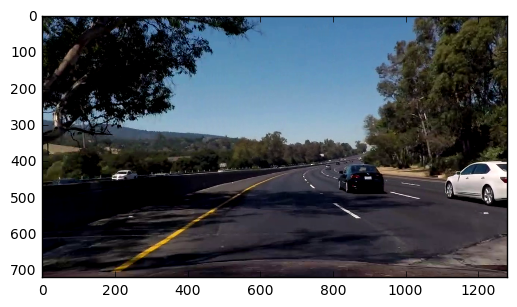

In [21]:
plt.imshow(image)

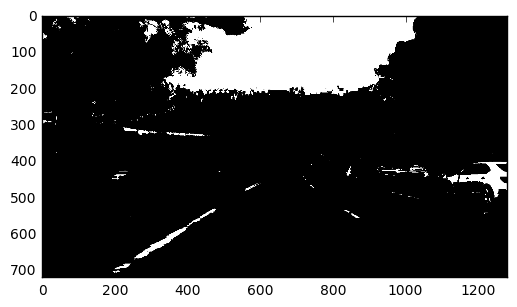

In [22]:
plt.imshow(get_color_selection(image), cmap="gray")

In [57]:
def get_binary_image(image):
    """
        Combines both gradient and color channel
        thresholds to create a binary image
    """
    sobel_binary = get_sobel_binary(image)
    
    s_channel_binary = get_hls_channel_binary(image)

    l_channel_binary = get_hls_channel_binary(image, channel_name="l", thresh_min=200)

    gray_scale_thresholded_image = get_grayscale_thresholded_img(image)
        
    color_sel = get_color_selection(image)

    combined_binary = np.zeros_like(s_channel_binary)

    combined_binary[ (color_sel == 255) | ((s_channel_binary == 1) & (l_channel_binary == 1)) 
                    | ((sobel_binary == 1) & (gray_scale_thresholded_image == 1)) | (l_channel_binary == 1)] = 1
    
    return combined_binary

In [ ]:
bin_image = get_binary_image(image)
plot_on_subplots([image, bin_image], ["Original Image", "Binary Image"], cmap="gray")

## Region of Interest Selection

In [59]:
def select_region_of_interest(image):
    """
        Given an image, this function returns an image
        with only the part which is likely to contain lane lines
        not masked out
    """
    bottom_left = (image.shape[1] * 0.15, image.shape[0])
    bottom_right = (image.shape[1] * 0.93, image.shape[0])

    top_left = (image.shape[1] * 0.4 , image.shape[0]/2)
    top_right = (image.shape[1] * 0.6 , image.shape[0]/2)
    
    white = np.zeros_like(image)
    points = np.array([[bottom_left, top_left, top_right, bottom_right]], dtype=np.int32)
    cv2.fillPoly(white, points , 255)
    
    masked_image = cv2.bitwise_and(image, white)
    
    #cv2.polylines(masked_image, points, False, 255)

    return masked_image

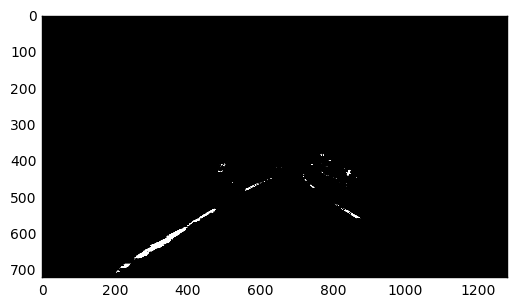

In [60]:
roi_image = select_region_of_interest(bin_image)
plt.imshow(roi_image, cmap="gray")

In [61]:
import math
# Hough transform parameters
rho = 1 # distance resolution in pixels of the Hough grid
theta = np.pi/180 # angular resolution in radians of the Hough grid
threshold = 30     # minimum number of votes (intersections in Hough grid cell)
min_line_length = 1 # minimum number of pixels making up a line
max_line_gap = 5    # maximum gap in pixels between connectable line segments

gaussian_kernel_size = 5

canny_low_threshold = 50
canny_high_threshold = 150
alpha = 1

prev_line_1 = None
prev_line_2 = None

def first_order_filter(x_new, x_old):
    return math.floor((alpha)*x_old + (1-alpha)*x_new)

def get_single_line(lines, y_min, y_max, old_line):
    points = []
    total_slope = 0
    total_y_intercept = 0
    n = len(lines)
    for line in lines:
        for x1,y1,x2,y2 in line:
            slope = (y2 - y1)/(x2 - x1)
            total_slope += slope
            total_y_intercept += (y1 - slope * x1)
    
    average_slope = total_slope/n
    average_y_intercept = total_y_intercept/n
    
    x1 = int((y_min - average_y_intercept)/average_slope)
    x2 = int((y_max - average_y_intercept)/average_slope)
    
    #if(old_line):
    #    x1 = first_order_filter(x1, old_line[0])
    #    x2 = first_order_filter(x2, old_line[2])
    
    return (x1, y_min,x2, y_max)

def intersects(line1, line2):
    return False

def draw_single_line(img, line, color, thickness):
    x1, y1, x2, y2 = line
    cv2.line(img, (x1, y1), (x2, y2), color, thickness)
#     cv2.line(img, (x1, y_min), (x2, y_max), color, thickness)


def find_slope(line):
    return (line[0][3]-line[0][1])/(line[0][2]-line[0][0])

def draw_lines(img, lines, color=[255, 0, 0], thickness=2):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    # Find the global y_min
    y_min_point1 = min(lines, key=lambda x: x[0][1])
    y_min_point2 = min(lines, key=lambda x: x[0][3])
    y_min = int(img.shape[0] * 0.7) #max(y_min_point1[0][1], y_min_point2[0][3])
    y_max = img.shape[0]
    
    positive_slopes = list(filter(lambda line: (find_slope(line) > 0.5) and (find_slope(line) < 0.9) and (find_slope(line) < np.inf), lines))
                                                                              
    negative_slopes = list(filter(lambda line: (find_slope(line) < -0.5) and (find_slope(line) > -0.9) and (find_slope(line) > -np.inf) , lines))
    
    line1 = None
    line2 = None
    
    if(len(positive_slopes) > 0):
        global prev_line_1
        line1 = get_single_line(positive_slopes, y_min, y_max, prev_line_1)
        prev_line_1 = line1
        draw_single_line(img, line1, color, thickness)
        
    if(len(negative_slopes) > 0):
        global prev_line_2
        line2 = get_single_line(negative_slopes, y_min, y_max, prev_line_2)
        prev_line_2 = line2
        draw_single_line(img, line2, color, thickness)
    
    ret = [None, None]
    if(line1):
        ret[0] = line1
    elif(prev_line_1):
        ret[0] = prev_line_1
    
    else:
        return None
    
    if(line2):
        ret[1] = line2
    elif(prev_line_2):
        ret[1] = prev_line_2
    else:
        return None
    
    return ret

    
def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros(img.shape, dtype=np.uint8)
    lines = draw_lines(line_img, lines, thickness=5)
    return lines, line_img

# Python 3 has support for cool math symbols.

def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)


def get_blank_image(image):
    """
        Return a blank image with the same dimensions as
        the input image
    """
    return np.zeros(image.shape, dtype=np.uint8)

In [62]:
lines, lines_image = hough_lines(roi_image, rho=rho, theta=theta, threshold=threshold, min_line_len=min_line_length, max_line_gap=max_line_gap)

In [63]:
colored_lines_image = np.dstack((lines_image, get_blank_image(lines_image), get_blank_image(lines_image)))
final = weighted_img(colored_lines_image, mpimg.imread(glob.glob("test_images/*")[0]))

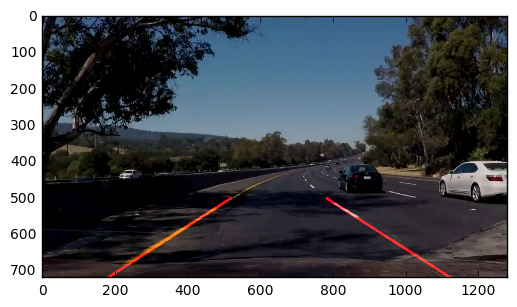

In [64]:
plt.imshow(final)

In [65]:
def compute_transformation_matrix(image, hough_lines):
    """
        Function that returns a warped image of a given image
    """
    if(not hough_lines):
        return None, image
    
    # Decide the final hieght of the transformed points
    y_limit = image.shape[0] * 0.4
    
    # Determine the original and destination points based on the hough lines
    line1, line2 = lines
    
    # Top Right, # Bottom Right, # Top left, # Bottom left
    original_img_pts = [[line1[0], line1[1]], [line1[2], line1[3]], [line2[0], line2[1]], [line2[2], line2[3]]]
    
    destination_pts = [[line1[2], y_limit], [line1[2], line1[3]], [line2[2], y_limit], [line2[2], line2[3]]]
    
    # Define calibration box in source(original) and destination(warped/desired) image
    
    image_shape = (image.shape[1], image.shape[0])
    
    # Four source coordinates
    src = np.float32(original_img_pts)
    
    # Four desired points - eyeballing a rectangle in that same image
    dst = np.float32(destination_pts)
    
    # Compute the perspective transformation matrix
    M = cv2.getPerspectiveTransform(src, dst)
    
    # Compute the inverse perspective transformation matrix
    M_inv = cv2.getPerspectiveTransform(dst, src)
    
    # We can also get the inverse perspective transform to unwarp the image 
    # using cv2.getPerspectiveTransform(dst, src)
    
    # cv2.INTER_LINEAR: How to fill in missing points as it warps an image
    # Linear interpolation
    return (M, M_inv)

In [66]:
def get_transformation_matrix(test_image):
    
    plt.imshow(test_image)
    plt.show()
    test_image = undistort(test_image)
    plt.imshow(test_image)
    plt.show()

    bin_image = get_binary_image(test_image)
    plt.imshow(bin_image, cmap="gray")
    plt.show()
    roi_image = select_region_of_interest(bin_image)
    lines, lines_image = hough_lines(roi_image, rho=rho, theta=theta, threshold=threshold, min_line_len=min_line_length, max_line_gap=max_line_gap)

    colored_lines_image = np.dstack((lines_image, get_blank_image(lines_image), get_blank_image(lines_image)))

    final = weighted_img(colored_lines_image, test_image)
    plt.imshow(final)
    plt.show()
    M, M_inv = compute_transformation_matrix(test_image, lines)
    return (M, M_inv)
    #plt.imshow(transformed)

In [67]:
def transform_perspective(image, M):
     return cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)

In [68]:
def get_lane_lines_base(image):
    """
        Input: image which is a binary thresholded image and perspective transformed
        Returns: Coordinated of the base of the lane line (left, right)
    """
    histogram = np.sum(image[image.shape[0]/2:,:], axis=0)
    
    indexes = find_peaks_cwt(histogram, np.arange(1, 550))
#     print(indexes)
#     peaks = np.histogram(argrelmax(histogram))
    
#     # Find indices of the top 2 frequencies
#     indices = np.argpartition(peaks[0], -2)[-2:]
    
#     # Find the correspondin values
#     x_values = peaks[1][ind]            
    
#     # Ensure the order is left, right
#     x_values =  np.sort(x_values)
    
    return [(indexes[0], image.shape[0]), (indexes[-1], image.shape[0])]

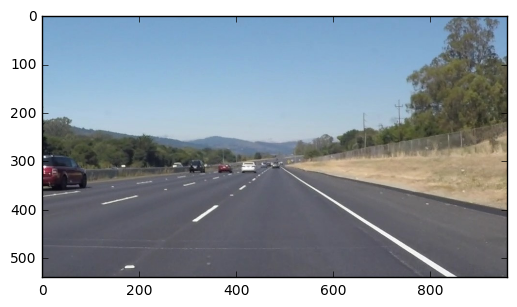

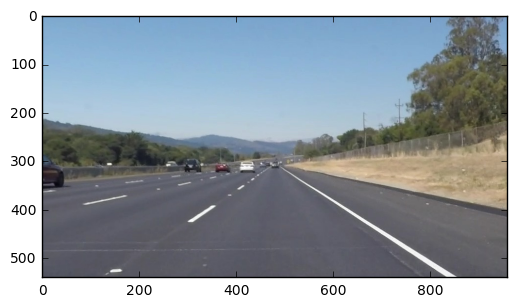

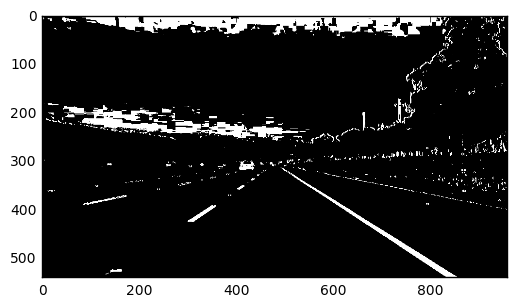

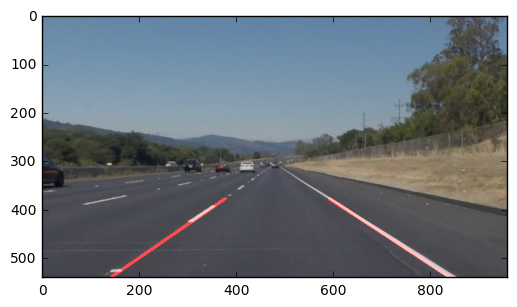

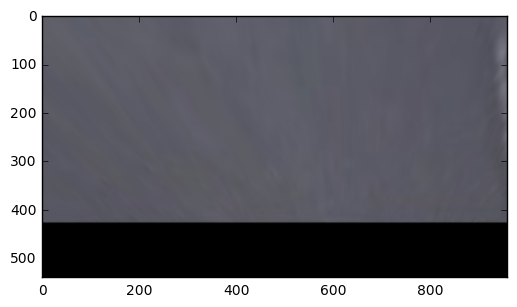

In [69]:
test_image = plt.imread(glob.glob("test_images/*")[2])
M, M_inv = get_transformation_matrix(test_image)
warped = transform_perspective(test_image, M)
plt.imshow(warped)

In [70]:
def get_lane_pixels(image, lane_base):
    # Plotting for diagnostic purpose
#     plt.imshow(image, cmap="gray")
#     plt.plot(lane_base[0], lane_base[1], "o")
#     plt.show()

    
    window_size = 100 * 2
    
    x_base = lane_base[0]
    
    if(x_base > window_size):
        window_low = x_base - window_size/2
    else:
        window_low = 0
        
    window_high = x_base + window_size/2
    
    # Define a region
    window = image[:, window_low:window_high]

    # Find the coordinates of the white pixels in this region
    x, y = np.where(window == 1)
    
    # Add window low as an offset
    y += np.uint64(window_low)
    
    
    # Plotting for diagnostic purpose
#     zero = np.zeros_like(image)
#     zero[x, y] = 1
    
#     plt.imshow(zero)
#     plt.show()
    
    return (x, y)


In [71]:
def get_curved_lane_line(pixels):
    x, y = pixels
    degree = 2
    return np.polyfit(x, y, deg=degree)

In [72]:
def draw_curved_line(image, line):
    p = np.poly1d(line)
    x = list(range(0, image.shape[0]))
    y = list(map(int, p(x)))
#     image[x, y] = (255, 255, 255)
    pts = np.array([[_y,_x] for _x, _y in zip(x, y)])
    
    pts = pts.reshape((-1,1,2))
    
    cv2.polylines(image, np.int32([pts]), False, color=(255,0,0), thickness=50)
    return pts


In [73]:
def calculate_rad_curvature(image, left_pixels):
    y, x = left_pixels
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/image.shape[1] # meters per pixel in y dimension
    xm_per_pix = 3.7/image.shape[0] # meteres per pixel in x dimension
    
    y_eval = np.max(y)

    fit = np.polyfit(y*ym_per_pix, x*xm_per_pix, 2)
    
    return int(((1 + (2*fit[0]*y_eval + fit[1])**2)**1.5) \
                             /np.absolute(2*fit[0]))

In [74]:
def draw_lane_lines(image, left_pixels, right_pixels):
#     plt.imshow(image)
    
    image = np.zeros_like(image)
    
    line1 = get_curved_lane_line(left_pixels)
    line1_pts = draw_curved_line(image, line1)
    left_line_curvature = calculate_rad_curvature(image, left_pixels)
    
    line2 = get_curved_lane_line(right_pixels)
    line2_pts = draw_curved_line(image, line2)
    left_line_curvature = calculate_rad_curvature(image, right_pixels)
    
    top_points = [line1_pts[-1], line2_pts[-1]]
    base_points = [line1_pts[0], line2_pts[0]]
    
    # Fill in the detected lane
    cv2.fillPoly(image, [np.concatenate((line2_pts, line1_pts, top_points,base_points ))], color=(152,251,152))
    
    return (image, left_line_curvature, left_line_curvature)

In [78]:
def process_image(image):
    """
        Return the result of passing the image
        through the pipeline
    """
    
    try:
        blurred_img = gaussian_blur(image)

        undistorted_image = undistort(blurred_img)

        binary_image = get_binary_image(undistorted_image)

        roi_image = select_region_of_interest(binary_image)

        persp_transform = transform_perspective(roi_image, M)

        lane_base = get_lane_lines_base(persp_transform)

        left_base, right_base = lane_base

        left_pixels = get_lane_pixels(persp_transform, left_base)

        right_pixels = get_lane_pixels(persp_transform, right_base)

        warped_with_lane_lines, left_curv, right_curv = draw_lane_lines(image, left_pixels, right_pixels)

        lane_lines = transform_perspective(image=warped_with_lane_lines, M=M_inv)

        final = weighted_img(lane_lines, image)

        cv2.putText(final, "Left Curvature: " + str(left_curv) + " (m)", (100, 100), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,255))
        cv2.putText(final, "Right Curvature: " + str(right_curv) + " (m)", (100, 150), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,255))
    except Exception as e:
        return image
#     plt.imshow(final)
#     plt.show()
#     plt.imshow(image)
#     plt.show()
#     plt.imshow(persp_transform, cmap="gray")
    
#     print(lane_base)
#     for point in lane_base:
#         x,y = point
#         plt.plot(x, y, 'o')
#     plt.show()
    
    # persp_transform = persp_transform * 255
    
    # colored_persp = np.dstack((persp_transform, persp_transform, persp_transform))
    
    
#     lines, lines_image = hough_lines(roi_image, rho=rho, theta=theta, threshold=threshold, min_line_len=min_line_length, max_line_gap=max_line_gap)
    
#     colored_lines_image = np.dstack((lines_image, get_blank_image(lines_image), get_blank_image(lines_image)))
    
#     final = weighted_img(colored_lines_image, image)
    
#     M, warped = warp(final, lines)
    
    ##
    ##
    ##p

    #plot_on_subplots([persp_transform, final], ["Original Image", "Processed Image"], cmap="gray")
    return final


In [79]:
for image_name in glob.glob("test_images/*")[2:]:
    try:
        prev_line_1 = None
        prev_line_2 = None
        img = mpimg.imread(image_name)
        result = process_image(img)
    except Exception as e:
        print(e)
        plt.imshow(img)
        plt.show()


In [80]:
## Display images before and after the pipeline

#for image_name in glob.glob("test_images/*")[4:5]:
# image = glob.glob("test_images/*")[5]
# img = mpimg.imread(image)
# plt.imshow(result[:,100:300], cmap="gray")
# plt.plot(167, 32, 'o')
# plt.show()
# prev_line_1 = None
# prev_line_2 = None


# result = process_image(img)
# histogram = np.sum(result[result.shape[0]/2:,:], axis=0)
# print(histogram)
# plt.plot(histogram)
# plt.show()

In [81]:
# plt.imshow(result)
# plt.show()
# x, y = np.where(result[:, 100:1200] == 1)


# line = np.polyfit(x, y, deg=2)
# p = np.poly1d(line)

# zero = np.zeros_like(result, dtype=np.int64)


# x = list(range(0, result.shape[0]))
# p = list(map(int, p(x)))

# zero[x, p] = 1
# plt.imshow(zero, cmap="gray")
# plt.show()

In [82]:
# zero = np.zeros_like(result)
# zero[x, y] = 1
# plt.imshow(zero, cmap="gray")

In [83]:
# x = np.arange(9.).reshape(3, 3)
# print(x)
# np.where( x > 5 )

In [84]:
# plt.imshow(result[:,100:300], cmap="gray")
# for _x, _y in zip(x,y):
#     plt.plot(_x, _y, '.')
#     pass
# plt.show()

In [85]:
# from scipy.signal import argrelmax
# from scipy.signal import argrelextrema
# from scipy.signal import find_peaks_cwt

# indexes = find_peaks_cwt(histogram, np.arange(1, 550))
# indexes

# extrema = argrelmax(histogram)
# print(extrema)
# peaks = np.histogram(extrema)
# peaks

In [86]:
# Find indices of the top 2 elements
# ind = np.argpartition(peaks[0], -2)[-2:]
# peaks[1][ind]

In [87]:
# plt.plot(histogram)
# for peak in peaks[1][ind]:
#     plt.plot(peak, 0, "o")
# plt.plot(1113, 0, "o")
# plt.show()

In [88]:
# points = get_lane_lines_base(result)

# plt.imshow(result, cmap="gray")
# for point in points:
#     x,y = point
#     plt.plot(x, y, 'o')
# plt.plot(1113, y, 'o')
# plt.show()

In [89]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [ ]:
def process(image):
    return process_image(image)

In [ ]:
white_output = 'white.mp4'
clip1 = VideoFileClip("./project_video.mp4")
white_clip = clip1.fl_image(process) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video white.mp4
[MoviePy] Writing video white.mp4


 60%|██████    | 760/1261 [03:28<02:15,  3.69it/s]

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))